### Notebook for the label transfer of Healthy-CTRL to rest of samples and conditions with `scANVI`

- **Developed by:** Carlos Talavera-López Ph.D
- **Modified by:** Mairi McClean
- **Institute of Computational Biology - Computational Health Department - Helmholtz Munich**
- original: v230504; modified v2305012


### Import required modules

In [1]:
import torch
import scvi
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from scib_metrics.benchmark import Benchmarker

Global seed set to 0
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/mairi.mcclean/mambaforge/envs/label_transfer_scvi/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)


### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.9.1
scanpy      1.9.3
-----
CoreFoundation      NA
Foundation          NA
PIL                 9.4.0
PyObjCTools         NA
absl                NA
anyio               NA
appnope             0.1.3
asttokens           NA
attr                22.2.0
babel               2.12.1
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
brotli              NA
certifi             2022.12.07
cffi                1.15.1
charset_normalizer  3.1.0
chex                0.1.7
colorama            0.4.6
comm                0.1.3
contextlib2         NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
defusedxml          0.7.1
docrep              0.3.2
executing           1.2.0
fastjsonschema      NA
flax                0.6.1
fsspec              2023.4.0
gmpy2               2.1.2
h5py                3.8.0
hypergeom_ufunc     NA
idna                3.4
igraph              0.10.4
importlib_resource

In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Global seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

### Read in Healthy data

In [5]:
adata_reference = sc.read_h5ad('../data/meyer_nikolic_covid_pbmc_raw.h5ad')
adata_reference

AnnData object with n_obs × n_vars = 422220 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'patient_id', 'sample_id', 'sequencing_library', 'Protein_modality_weight'
    var: 'name'

- Subset for healthy controls

In [6]:
healthy_ctrl = adata_reference[adata_reference.obs['COVID_status'].isin(['Healthy'])]
healthy_ctrl.obs['COVID_status'].value_counts()

COVID_status
Healthy    173684
Name: count, dtype: int64

### Reference.obs formatting
- First level of label transfer will be performed with 'broad' category

In [ ]:
healthy_ctrl.obs.rename(columns={"patient_id": "donor"}, inplace=True)
healthy_ctrl.obs.rename(columns={"COVID_status": "status"}, inplace=True)
healthy_ctrl.obs.rename(columns={"Sex": "gender"}, inplace=True)
healthy_ctrl.obs.rename(columns={"Age_group": "age"}, inplace=True)
healthy_ctrl.obs['tissue'] = 'PBMC'
healthy_ctrl.obs

In [8]:
healthy_ctrl.obs['seed_labels'] = healthy_ctrl.obs['annotation_broad'].copy()
del(healthy_ctrl.obs['annotation_broad'])
healthy_ctrl

AnnData object with n_obs × n_vars = 173684 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'age', 'BMI', 'COVID_severity', 'status', 'Ethnicity', 'Group', 'gender', 'Smoker', 'annotation_detailed', 'annotation_detailed_fullNames', 'donor', 'sample_id', 'sequencing_library', 'Protein_modality_weight', 'tissue', 'seed_labels'
    var: 'name'

In [9]:
healthy_ctrl.obs['seed_labels'].value_counts()

seed_labels
T CD4+       49415
T CD8+       34110
Monocyte     28637
B            26132
NK           21871
T reg         3251
T g/d         3183
MAIT          2213
DC            2151
Cycling       1012
Platelets      626
HPC            416
Plasma         352
ILC            199
RBC            106
Baso/Eos        10
Name: count, dtype: int64

### Read in query dataset and subset

In [10]:
query = sc.read_h5ad('../data/Cai2020_scRNA_PBMC_mm230315_qcd.h5ad')
query.obs['seed_labels'] = 'Unknown'
query

AnnData object with n_obs × n_vars = 73146 × 61533
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'predicted_doublets', 'seed_labels'
    var: 'gene_id', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'donor_colors'
    layers: 'counts', 'sqrt_norm'

In [11]:
query.obs['status'].value_counts()

status
active_TB    33104
Healthy      22049
latent_TB    17993
Name: count, dtype: int64

In [12]:
query_healthy = query[query.obs['status'].isin(['Healthy'])]


### Concatenate data

In [13]:
adata = healthy_ctrl.concatenate(query_healthy, batch_key = 'dataset', batch_categories = ['reference', 'query'], join = 'inner')
adata

AnnData object with n_obs × n_vars = 195733 × 22792
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'age', 'BMI', 'COVID_severity', 'status', 'Ethnicity', 'Group', 'gender', 'Smoker', 'annotation_detailed', 'annotation_detailed_fullNames', 'donor', 'sample_id', 'sequencing_library', 'Protein_modality_weight', 'tissue', 'seed_labels', 'study', 'individual', 'sample', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'predicted_doublets', 'dataset'
    var: 'gene_id-query', 'mt-query', 'ribo-query', 'n_cells_by_counts-query', 'mean_counts-query', 'pct_dropout_by_counts-query', 'total_counts-query', 'name-reference'

- Remove unrequired .obs to reduce object size

In [15]:
adata.obs = adata.obs.drop(columns= ['version', 'batch', 'Ethnicity', 'Group', 'sequencing_library', 'Protein_modality_weight', 
'individual', 'sample', 'COVID_severity', 'Smoker', 'BMI', 'nFeature_ADT', 'nCount_ADT', 'nFeature_RNA', 'nCount_RNA', 'orig.ident', 
'G2M_score', 'predicted_doublets', 'total_counts_mt', 'total_counts', 'n_genes_by_counts', 'n_genes', 'age', 'gender', 'data_type', 
'centre', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score'])


- Replace 'NaN' for remaining columns

In [16]:
adata.obs['study'] = adata.obs['study'].cat.add_categories("Yoshida_2021").fillna("Yoshida_2021")

In [18]:
adata.obs = adata.obs.drop(columns= ['sample_id'])

### Select HVGs

In [19]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "donor",
    subset = True
)
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 195733 × 7000
    obs: 'status', 'annotation_detailed', 'annotation_detailed_fullNames', 'donor', 'tissue', 'seed_labels', 'study', 'dataset'
    var: 'gene_id-query', 'mt-query', 'ribo-query', 'n_cells_by_counts-query', 'mean_counts-query', 'pct_dropout_by_counts-query', 'total_counts-query', 'name-reference', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    layers: 'counts'

### Transfer of annotation with scANVI

In [20]:
scvi.model.SCVI.setup_anndata(adata, categorical_covariate_keys = ["donor", "study"], labels_key = "seed_labels", layer = 'counts')

In [21]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [ ]:
scvi.model.SCVI.view_anndata_setup(scvi_model)

In [23]:
scvi_model.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 41/41: 100%|██████████| 41/41 [36:59<00:00, 54.71s/it, loss=1.5e+03, v_num=1] 

`Trainer.fit` stopped: `max_epochs=41` reached.


Epoch 41/41: 100%|██████████| 41/41 [36:59<00:00, 54.13s/it, loss=1.5e+03, v_num=1]


In [24]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation()

- Cluster and visualize latent space

In [25]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.leiden(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:46)


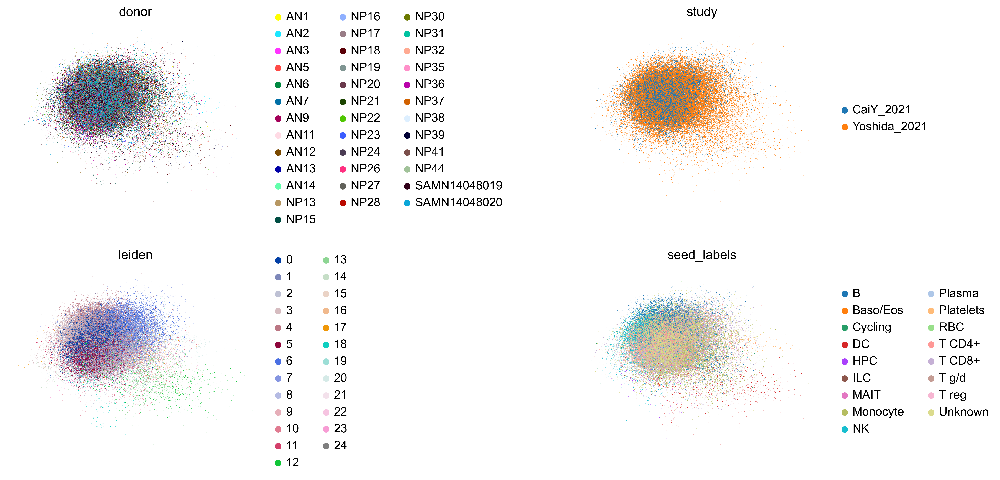

In [42]:
sc.pl.embedding(
    adata,
    basis="X_scVI",
    color=["donor", "study", "leiden", "seed_labels"],
    frameon=False,
    ncols=2,
    wspace=1
)

### Label transfer with `scANVI` 

In [27]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [28]:
scanvi_model.train(25)

INFO     Training for 25 epochs.                                                                                   


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 25/25: 100%|██████████| 25/25 [36:56<00:00, 85.26s/it, loss=1.59e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=25` reached.


Epoch 25/25: 100%|██████████| 25/25 [36:56<00:00, 88.67s/it, loss=1.59e+03, v_num=1]


In [29]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

In [ ]:
adata.obs

- Extract latent representation

In [31]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

- Visualise corrected dataset

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:00)


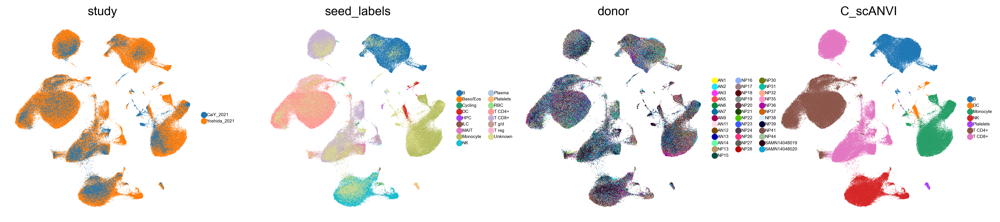

In [32]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.3, spread = 4, random_state = 1712)
sc.pl.umap(adata, frameon = False, color = ['study', 'seed_labels', 'donor', 'C_scANVI'], size = 1, legend_fontsize = 5, ncols = 4)

### Compute integration metrics

In [35]:
adata

AnnData object with n_obs × n_vars = 195733 × 7000
    obs: 'status', 'annotation_detailed', 'annotation_detailed_fullNames', 'donor', 'tissue', 'seed_labels', 'study', 'dataset', '_scvi_batch', '_scvi_labels', 'leiden', 'C_scANVI'
    var: 'gene_id-query', 'mt-query', 'ribo-query', 'n_cells_by_counts-query', 'mean_counts-query', 'pct_dropout_by_counts-query', 'total_counts-query', 'name-reference', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'leiden', 'donor_colors', 'study_colors', 'leiden_colors', 'seed_labels_colors', 'umap', 'C_scANVI_colors'
    obsm: '_scvi_extra_categorical_covs', 'X_scVI', 'X_scANVI', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [36]:
bm = Benchmarker(
    adata,
    batch_key = 'donor',
    label_key = "C_scANVI",
    embedding_obsm_keys = ["X_pca", "X_scVI", "X_scANVI"],
    n_jobs = -1,
)
bm.benchmark()

computing PCA
    with n_comps=50
    finished (0:00:16)


Embeddings: 100%|██████████| 3/3 [2:01:54<00:00, 2438.30s/it]


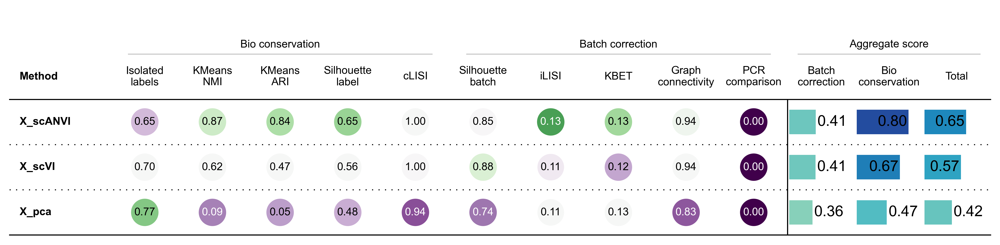

In [37]:
bm.plot_results_table(min_max_scale = False)

### Export annotated sample object 

In [43]:
adata.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata.obs.index])
adata.obs.index

Index(['CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAGATGA-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCATTTGGG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCCGAAGAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCTGCTTGC-1',
       ...
       'TTTGTCACAATGGAAT-H1-query', 'TTTGTCACAGCGTCCA-H1-query',
       'TTTGTCACAGTAGAGC-H1-query', 'TTTGTCACATAGACTC-H1-query',
       'TTTGTCACATCGTCGG-H1-query', 'TTTGTCAGTCGCGGTT-H1-query',
       'TTTGTCAGTCGCTTCT-H1-query', 'TTTGTCAGTTCGAATC-H1-query',
       'TTTGTCAGTTTGGGCC-H1-query', 'TTTGTCATCCCATTAT-H1-query'],
      dtype='object', length=1957

In [44]:
adata_raw.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata_raw.obs.index])
adata_raw.obs.index

Index(['CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAGATGA-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCATTTGGG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCCGAAGAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCTGCTTGC-1',
       ...
       'TTTGTCACAATGGAAT-H1-query', 'TTTGTCACAGCGTCCA-H1-query',
       'TTTGTCACAGTAGAGC-H1-query', 'TTTGTCACATAGACTC-H1-query',
       'TTTGTCACATCGTCGG-H1-query', 'TTTGTCAGTCGCGGTT-H1-query',
       'TTTGTCAGTCGCTTCT-H1-query', 'TTTGTCAGTTCGAATC-H1-query',
       'TTTGTCAGTTTGGGCC-H1-query', 'TTTGTCATCCCATTAT-H1-query'],
      dtype='object', length=1957

In [45]:
adata.obs_names

Index(['CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAAGTAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGGTTAGATGA-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCATTTGGG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCCGAAGAG-1',
       'CV001_KM10202384-CV001_KM10202394_AAACCTGTCTGCTTGC-1',
       ...
       'TTTGTCACAATGGAAT-H1-query', 'TTTGTCACAGCGTCCA-H1-query',
       'TTTGTCACAGTAGAGC-H1-query', 'TTTGTCACATAGACTC-H1-query',
       'TTTGTCACATCGTCGG-H1-query', 'TTTGTCAGTCGCGGTT-H1-query',
       'TTTGTCAGTCGCTTCT-H1-query', 'TTTGTCAGTTCGAATC-H1-query',
       'TTTGTCAGTTTGGGCC-H1-query', 'TTTGTCATCCCATTAT-H1-query'],
      dtype='object', length=1957

In [46]:
adata.obs['C_scANVI'].cat.categories

Index(['B', 'DC', 'Monocyte', 'NK', 'Platelets', 'T CD4+', 'T CD8+'], dtype='object')

In [47]:
adata.obs['C_scANVI'].value_counts()

C_scANVI
T CD4+       57118
T CD8+       46505
Monocyte     32876
B            28240
NK           27302
DC            2750
Platelets      942
Name: count, dtype: int64

### Export annotated object with raw counts

In [48]:
adata

AnnData object with n_obs × n_vars = 195733 × 7000
    obs: 'status', 'annotation_detailed', 'annotation_detailed_fullNames', 'donor', 'tissue', 'seed_labels', 'study', 'dataset', '_scvi_batch', '_scvi_labels', 'leiden', 'C_scANVI'
    var: 'gene_id-query', 'mt-query', 'ribo-query', 'n_cells_by_counts-query', 'mean_counts-query', 'pct_dropout_by_counts-query', 'total_counts-query', 'name-reference', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'leiden', 'donor_colors', 'study_colors', 'leiden_colors', 'seed_labels_colors', 'umap', 'C_scANVI_colors', 'pca'
    obsm: '_scvi_extra_categorical_covs', 'X_scVI', 'X_scANVI', 'X_umap', 'X_pca'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [49]:
adata_raw

AnnData object with n_obs × n_vars = 195733 × 22792
    obs: 'status', 'annotation_detailed', 'annotation_detailed_fullNames', 'donor', 'tissue', 'seed_labels', 'study', 'dataset'
    var: 'gene_id-query', 'mt-query', 'ribo-query', 'n_cells_by_counts-query', 'mean_counts-query', 'pct_dropout_by_counts-query', 'total_counts-query', 'name-reference'

In [50]:
adata_export = anndata.AnnData(X = adata_raw.X, obs = adata.obs, var = adata_raw.var)
# adata_export.obsm['X_scVI'] = adata.obsm['X_scVI'].copy()
adata_export.obsm['X_umap'] = adata.obsm['X_umap'].copy()
adata_export.obsm['X_scANVI'] = adata.obsm['X_scANVI'].copy()
adata_export

AnnData object with n_obs × n_vars = 195733 × 22792
    obs: 'status', 'annotation_detailed', 'annotation_detailed_fullNames', 'donor', 'tissue', 'seed_labels', 'study', 'dataset', '_scvi_batch', '_scvi_labels', 'leiden', 'C_scANVI'
    var: 'gene_id-query', 'mt-query', 'ribo-query', 'n_cells_by_counts-query', 'mean_counts-query', 'pct_dropout_by_counts-query', 'total_counts-query', 'name-reference'
    obsm: 'X_umap', 'X_scANVI'

In [51]:
adata_export.write('../data/230512_scRNA_PBMC_human_healthy_scANVI_annot.raw.h5ad')

